In [34]:
! pip install opencv-python-headless==3.4.9.31

     |████████████████████████████████| 21.6 MB 1.6 MB/s 
Reason for being yanked: Release deprecated


In [1]:
# import the necessary packages
from skimage.segmentation import clear_border #Clear objects connected to the label image border.
from imutils import contours #define/read close images
import numpy as np
import argparse #recommended command-line parsing module in the Python standard library.
import imutils #Python basic image processing functional package to do image translation, rotation, resizing, skeletonization, or blur amount detection.
import cv2 #open cv is used for image processing/visualization

In [2]:
def extract_digits_and_symbols(image, charCnts, minW=5, minH=15):
	# grab the internal Python iterator for the list of character
	# contours, then  initialize the character ROI and location
	# lists, respectively
	charIter = charCnts.__iter__()
	rois = []
	locs = []

	# keep looping over the character contours until we reach the end
	# of the list
	while True:
		try:
			# grab the next character contour from the list, compute
			# its bounding box, and initialize the ROI
			c = next(charIter)
			(cX, cY, cW, cH) = cv2.boundingRect(c)
			roi = None

			# check to see if the width and height are sufficiently
			# large, indicating that we have found a digit
			if cW >= minW and cH >= minH:
				# extract the ROI
				roi = image[cY:cY + cH, cX:cX + cW]
				rois.append(roi)
				locs.append((cX, cY, cX + cW, cY + cH))

			# otherwise, we are examining one of the special symbols
			else:
				# MICR symbols include three separate parts, so we
				# need to grab the next two parts from our iterator,
				# followed by initializing the bounding box
				# coordinates for the symbol
				parts = [c, next(charIter), next(charIter)]
				(sXA, sYA, sXB, sYB) = (np.inf, np.inf, -np.inf,
					-np.inf)

				# loop over the parts
				for p in parts:
					# compute the bounding box for the part, then
					# update our bookkeeping variables
					(pX, pY, pW, pH) = cv2.boundingRect(p)
					sXA = min(sXA, pX)
					sYA = min(sYA, pY)
					sXB = max(sXB, pX + pW)
					sYB = max(sYB, pY + pH)

				# extract the ROI
				roi = image[sYA:sYB, sXA:sXB]
				rois.append(roi)
				locs.append((sXA, sYA, sXB, sYB))

		# we have reached the end of the iterator; gracefully break
		# from the loop
		except StopIteration:
			break

	# return a tuple of the ROIs and locations
	return (rois, locs)



In [3]:
# initialize the list of reference character names, in the same
# order as they appear in the reference image where the digits
# their names and:
# T = Transit (delimit bank branch routing transit #)
# U = On-us (delimit customer account number)
# A = Amount (delimit transaction amount)
# D = Dash (delimit parts of numbers, such as routing or account)
charNames = ["1", "2", "3", "4", "5", "6", "7", "8", "9", "0",
	"T", "U", "A", "D"]

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Image = Image.open('/content/drive/MyDrive/ChequeDetection/bearer-cheque.jpg')
# load the reference MICR image from disk, convert it to grayscale,
# and threshold it, such that the digits appear as *white* on a
# *black* background
ref = cv2.imread('/content/drive/MyDrive/ChequeDetection/micr_e13b_reference.png')
ref = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
ref = imutils.resize(ref, width=400)
ref = cv2.threshold(ref, 0, 255, cv2.THRESH_BINARY_INV |
	cv2.THRESH_OTSU)[1]

In [6]:
# find contours in the MICR image (i.e,. the outlines of the
# characters) and sort them from left to right
refCnts = cv2.findContours(ref.copy(), cv2.RETR_EXTERNAL,
	cv2.CHAIN_APPROX_SIMPLE)
refCnts = refCnts[0] if imutils.is_cv2() else refCnts[1]
refCnts = contours.sort_contours(refCnts, method="left-to-right")[0]

# create a clone of the original image so we can draw on it
clone = np.dstack([ref.copy()] * 3)

In [7]:
# create a clone of the original image so we can draw on it
clone = np.dstack([ref.copy()] * 3)

# loop over the (sorted) contours
for c in refCnts:
	# compute the bounding box of the contour and draw it on our
	# image
	(x, y, w, h) = cv2.boundingRect(c)
	cv2.rectangle(clone, (x, y), (x + w, y + h), (0, 255, 0), 2)



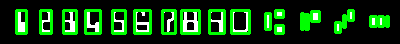

In [8]:
# show the output of applying the simple contour method
from google.colab.patches import cv2_imshow
cv2_imshow(clone)

In [9]:
# extract the digits and symbols from the list of contours, then
# initialize a dictionary to map the character name to the ROI
(refROIs, refLocs) = extract_digits_and_symbols(ref, refCnts,
	minW=10, minH=20)
chars = {}

# re-initialize the clone image so we can draw on it again
clone = np.dstack([ref.copy()] * 3)

In [10]:
for i in refROIs:
  cv2_imshow(i)

In [11]:
for i in refLocs:
  print(i)

(16, 10, 26, 33)
(40, 10, 51, 33)
(63, 10, 76, 33)
(85, 10, 100, 33)
(112, 10, 125, 33)
(134, 10, 150, 33)
(162, 10, 175, 33)
(181, 10, 199, 33)
(209, 10, 224, 33)
(231, 10, 249, 33)
(265, 10, 283, 33)
(301, 11, 319, 29)
(335, 10, 353, 32)
(370, 16, 388, 26)


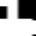

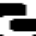

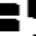

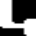

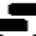

...

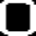

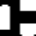

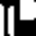

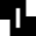

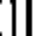

In [12]:
# loop over the reference ROIs and locations
for (name, roi, loc) in zip(charNames, refROIs, refLocs):
	# draw a bounding box surrounding the character on the output
	# image
	(xA, yA, xB, yB) = loc
	cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

	# resize the ROI to a fixed size, then update the characters
	# dictionary, mapping the character name to the ROI
	roi = cv2.resize(roi, (36, 36)) 
	chars[name] = roi

	# display the character ROI to our screen
	cv2_imshow(roi)
	# cv2.waitKey(0)


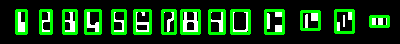

In [13]:
# show the output of our better method
cv2_imshow(clone)

In [14]:
chars

{'0': array([[  0,   0,   0, ...,   0,   0,   0],
        [  0,  29,  88, ...,  88,  29,   0],
        [ 25,  82, 197, ..., 191,  64,   0],
        ...,
        [  0,   6,  19, ...,  19,   6,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8),
 '1': array([[255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 144, 117, 117],
        [255, 255, 255, ...,  49,   0,   0]], dtype=uint8),
 '2': array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [230, 230, 230, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [117, 117, 153, ..., 153, 117, 117],
        [  0,   0,  67, ...,  67,   0,   0]], dtype=uint8),
 '3': array([[255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   

In [49]:
# initialize a rectangular kernel (wider than it is tall) along with
# an empty list to store the output of the check OCR
rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (17, 7))
output = []
# load the input image, grab its dimensions, and apply array slicing
# to keep only the bottom 20% of the image (that's where the account
# information is)
# image = cv2.imread("/content/drive/MyDrive/ChequeDetection/sbi_cts.jpeg")
# image = cv2.imread("/content/drive/MyDrive/ChequeDetection/bearer-cheque.jpg")
image = cv2.imread("/content/drive/MyDrive/ChequeDetection/X_138.jpeg")
(h, w,) = image.shape[:2]
delta = int(h - (h * 0.2))
bottom = image[delta:h, 0:w]

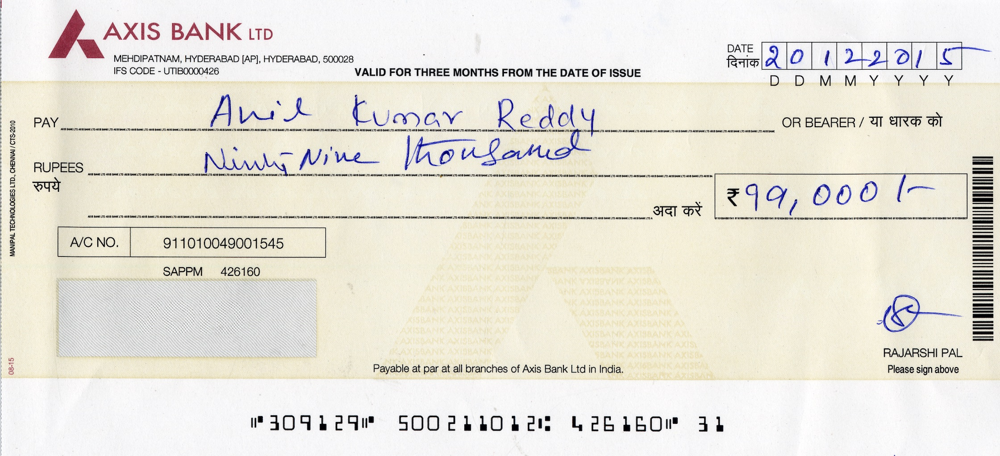

In [50]:
cv2_imshow(image)

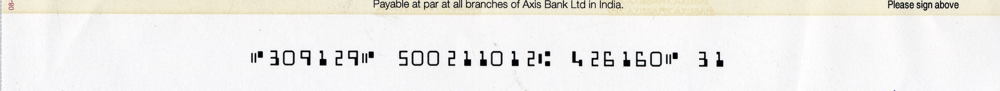

In [51]:
cv2_imshow(bottom)

In [52]:
# convert the bottom image to grayscale, then apply a blackhat
# morphological operator to find dark regions against a light
# background (i.e., the routing and account numbers)
gray = cv2.cvtColor(bottom, cv2.COLOR_BGR2GRAY)
blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rectKernel)

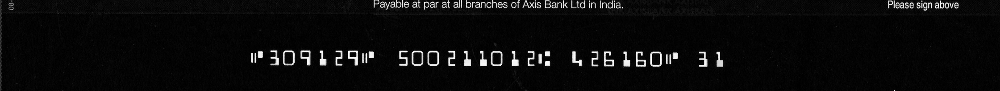

In [53]:
cv2_imshow(blackhat)

In [72]:
# compute the Scharr gradient of the blackhat image, then scale
# the rest back into the range [0, 255]
gradX = cv2.Sobel(blackhat, ddepth=cv2.CV_32F, dx=1, dy=0,
	ksize=7)
gradX = np.absolute(gradX)
(minVal, maxVal) = (np.min(gradX), np.max(gradX))
gradX = (255 * ((gradX - minVal) / (maxVal - minVal)))
gradX = gradX.astype("uint8")

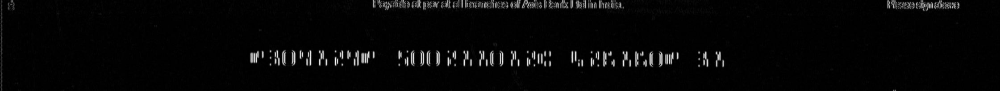

In [73]:
cv2_imshow(gradX)

In [74]:
# apply a closing operation using the rectangular kernel to help
# cloes gaps in between rounting and account digits, then apply
# Otsu's thresholding method to binarize the image
gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, rectKernel)
gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, rectKernel)
thresh = cv2.threshold(gradX, 0, 255,
cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

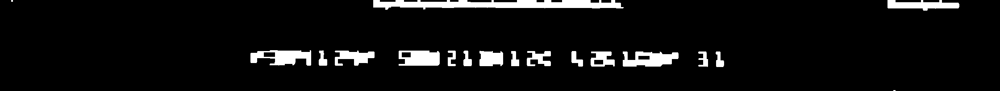

In [75]:
cv2_imshow(thresh)

In [76]:
# remove any pixels that are touching the borders of the image (this
# simply helps us in the next step when we prune contours)
thresh = clear_border(thresh)

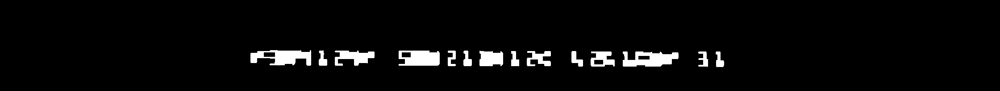

In [77]:
cv2_imshow(thresh)

In [78]:
# find contours in the thresholded image, then initialize the
# list of group locations
groupCnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
	cv2.CHAIN_APPROX_SIMPLE)
groupCnts = imutils.grab_contours(groupCnts)
groupLocs = []
# loop over the group contours
for (i, c) in enumerate(groupCnts):
	# compute the bounding box of the contour
	(x, y, w, h) = cv2.boundingRect(c)
	# only accept the contour region as a grouping of characters if
	# the ROI is sufficiently large
	if w > 5 and h > 5:
		groupLocs.append((x, y, w, h))
# sort the digit locations from left-to-right
groupLocs = sorted(groupLocs, key=lambda x:x[0])

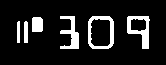

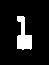

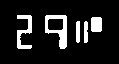

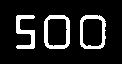

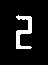

...

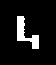

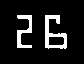

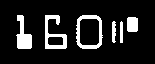

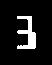

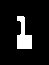

In [79]:
# loop over the group locations
for (gX, gY, gW, gH) in groupLocs:
	# initialize the group output of characters
	groupOutput = []
	# extract the group ROI of characters from the grayscale
	# image, then apply thresholding to segment the digits from
	# the background of the credit card
	group = gray[gY - 15:gY + gH + 15, gX - 15:gX + gW + 15]
	group = cv2.threshold(group, 0, 255,
		cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
	cv2_imshow(group)
	#cv2.waitKey(0)
	# find character contours in the group, then sort them from
	# left to right
	charCnts = cv2.findContours(group.copy(), cv2.RETR_EXTERNAL,
		cv2.CHAIN_APPROX_SIMPLE)
	charCnts = imutils.grab_contours(charCnts)
	charCnts = contours.sort_contours(charCnts,
		method="left-to-right")[0]
  	# find the characters and symbols in the group
	(rois, locs) = extract_digits_and_symbols(group, charCnts)
	# loop over the ROIs from the group
	for roi in rois:
		# initialize the list of template matching scores and
		# resize the ROI to a fixed size
		scores = []
		roi = cv2.resize(roi, (36, 36))
		# loop over the reference character name and corresponding
		# ROI
		for charName in charNames:
			# apply correlation-based template matching, take the
			# score, and update the scores list
			result = cv2.matchTemplate(roi, chars[charName],
				cv2.TM_CCOEFF)
			(_, score, _, _) = cv2.minMaxLoc(result)
			scores.append(score)
		# the classification for the character ROI will be the
		# reference character name with the *largest* template
		# matching score
		groupOutput.append(charNames[np.argmax(scores)])
  	# draw (padded) bounding box surrounding the group along with
    # the OCR output of the group
    	# draw (padded) bounding box surrounding the group along with
	# the OCR output of the group
	cv2.rectangle(image, (gX - 10, gY + delta - 10),
		(gX + gW + 10, gY + gY + delta), (0, 0, 255), 2)
	cv2.putText(image, "".join(groupOutput),
		(gX - 10, gY + delta - 25), cv2.FONT_HERSHEY_SIMPLEX,
		0.8, (0, 0, 255), 1)
	# add the group output to the overall check OCR output
	output.append("".join(groupOutput))


Check OCR: U309 1 29U 500 2 1 10 1 20 4 26 160U 3 1


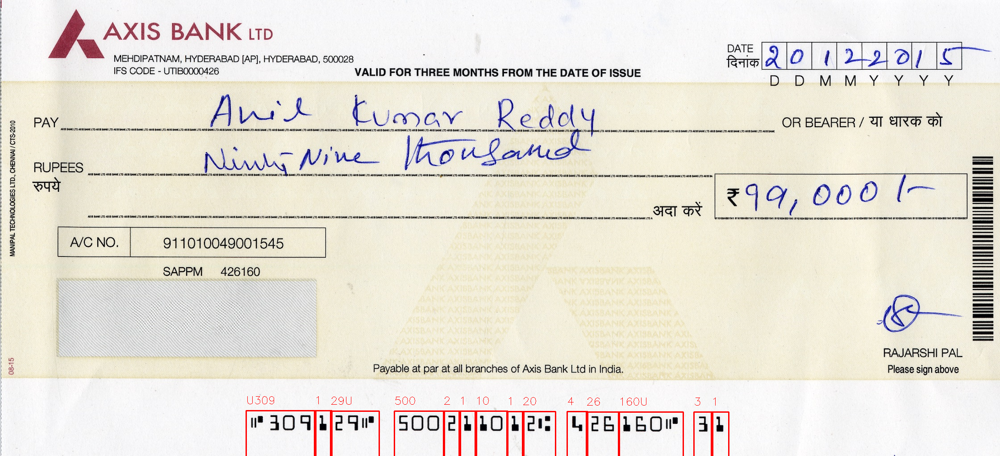

In [80]:
# display the output check OCR information to the screen
print("Check OCR: {}".format(" ".join(output)))
cv2_imshow(image)
#cv2.waitKey(0)

In [81]:
# Now we start the python tesseract
!pip install pillow
!pip install pytesseract
!sudo apt install tesseract-ocr
!sudo apt install libtesseract-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 40 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libtesseract-dev is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 40 not upgraded.


In [31]:
# import the necessary packages
from PIL import Image
import pytesseract
import argparse
import cv2
import os

In [32]:
!ls -alrt /usr/bin/tesseract

-rwxr-xr-x 1 root root 26712 Apr  7  2018 /usr/bin/tesseract


In [33]:
# load the example image and convert it to grayscale
# image = cv2.imread("/content/drive/MyDrive/ChequeDetection/sbi_cts.jpeg")
image = cv2.imread("/content/drive/MyDrive/ChequeDetection/X_138.jpeg")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# check to see if we should apply thresholding to preprocess the
# image
bgSettings = "blur" # "thresh" or "blur"
if bgSettings == "thresh":
	gray = cv2.threshold(gray, 0, 255,
		cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
# make a check to see if median blurring should be done to remove
# noise
elif bgSettings == "blur":
	gray = cv2.medianBlur(gray, 3)
# write the grayscale image to disk as a temporary file so we can
# apply OCR to it
filename = "{}.png".format(os.getpid())
cv2.imwrite(filename, gray)

True

In [34]:
filename

'845.png'

In [35]:
!ls

845.png  drive	sample_data


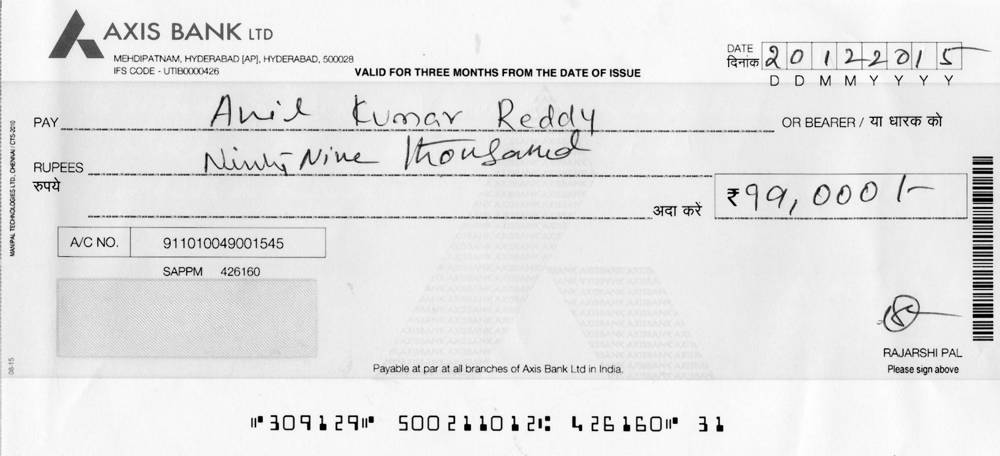

In [36]:
Image.open(filename)

MANIPAL TECHNOLOGIES LTD., CHENNAI / CTS-2010

hes BANK trp

MEHDIPATNAM, HYDERABAD [AP], HYDERABAD, 500028,

PAY __

RUPEES _____

IFS CODE - UTIB0000426

Bist Lumavy Rega

“Niwas Mme |iou

[rere |

 

VALID FOR THREE MONTHS FROM THE DATE OF ISSUE

  

an an meen ane a aS eS NE NN nen enn ene ann" aoe Pete ae

91 1010049001545

 

SAPPM 426160

Payable at par at all branches of Axis Bank Ltd in India.

m3a0Uecd SOOek~OaCH L2ELBOw Fb

DATE Perel | O say lst
D Versa Na

Ui
D MM i

__ OR BEARER / UT ORG SY

184Q, Ho OL -

RAJARSHI PAL
Please sign above

  



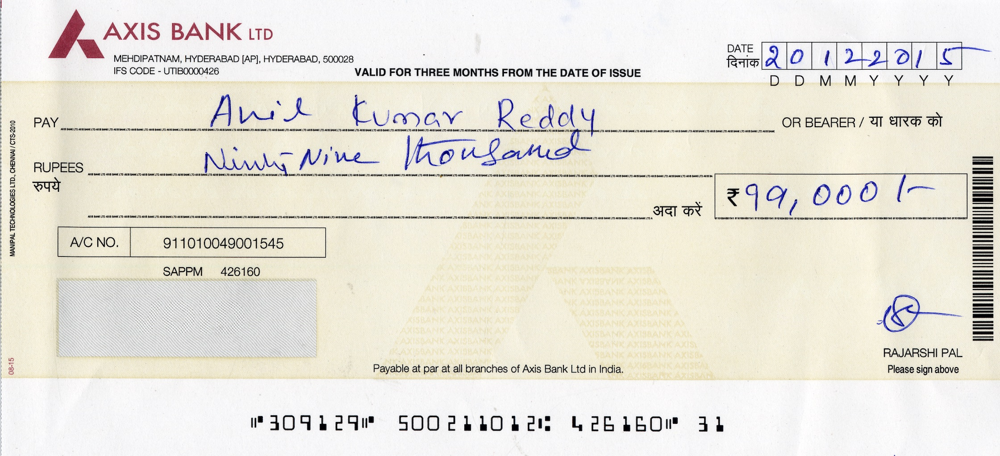

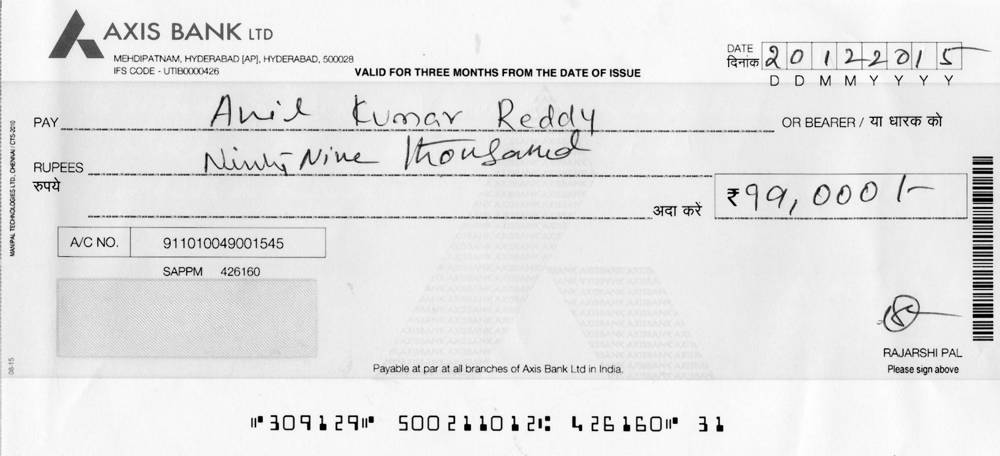

In [37]:
# load the image as a PIL/Pillow image, apply OCR, and then delete
# the temporary file
from google.colab.patches import cv2_imshow
# cv2_imshow(clone)
text = pytesseract.image_to_string(Image.open(filename), lang="eng")
os.remove(filename)
print(text)
# show the output images
cv2_imshow(image)
cv2_imshow(gray)